# Store Sales Forecasting in Ecuador

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Overview

The topic of my final project is Sales Forecasting. I wanted to address a topic that involved time series data as a challenge for me. The data is from Kaggle and includes data from a store chain in Ecuador. The goal of the project is to predict the sales for a set of product families at all of the stores for a range of test dates. This will be a **Regression** model. 

A model that predicts sales is useful in many business scenarios- this particular model(if worked) would be a useful tool for the Favorita store chain. Predicting how many sales you will have of certain items can drive youre purchasing and ensure that you do not buy too much or too little of a product. 

**Import the data**

This data set includes thousands of product families sold at Favorita stores located in Ecuador. This dataset includes dates, store and product information, whether that item was being promoted, as well as the sales numbers. The purpose of my project will be to predict the amount of sales (given in units sold) for a given la favorita store on a given date. The data is very large and for the competetion is already split into train and test sets- I will be working off of only their training set and using that to split into my train and test sets.

Data Format- .csv. I obtained the data through a kaggle competetition here: <br>

Store sales - time series forecasting. Kaggle. (n.d.). Retrieved March 6, 2023, from https://www.kaggle.com/competitions/store-sales-time-series-forecasting 

I am going to import packages throughout the document because I think it is easier to reference package names that way.

In [143]:
dataPth = r'data/*.csv'

data = pd.read_csv('data/train.csv')
holiday_events = pd.read_csv('data/holidays_events.csv')
oil = pd.read_csv('data/oil.csv')
stores = pd.read_csv('data/stores.csv')

**Data Info**
The dataset is comprised of 4 subsets- <br>
    -data: the main dataset, described below, will be the base dataset with other columns joined<br>
    -holiday_events: a dataset listing all holiday events(local and national) with dates<br>
    -oil: a dataset with daily oil prices for the entire time range covered in data<br>
    -stores: a dataset with some additional info on each store<br>


Main Dataset. <br>

X Features: date, id, store_nbr, onpromotion, family<br>
y Target: sales

Below I check use df.describe() to understand the numerical columns in more detail. I also print the data type of each column and the total number of null values in each column. This gives me a sense of the data that I will be working with and what I need to do in order to train my model.

You can see below that the size of the main raw dataset is **3,000,888 rows x 6 columns**

In [144]:
print(data.describe())
print('\nData Type of Each Column')
print(data.dtypes)

print('\nNumber of Null Values in each column:\n', data.isnull().sum(axis=0), '\n')

print(rf'# Columns in Dataset: {len(data.columns)}')
print(rf'# of Samples(Rows) in Dataset: {len(data)}')

                 id     store_nbr         sales   onpromotion
count  3.000888e+06  3.000888e+06  3.000888e+06  3.000888e+06
mean   1.500444e+06  2.750000e+01  3.577757e+02  2.602770e+00
std    8.662819e+05  1.558579e+01  1.101998e+03  1.221888e+01
min    0.000000e+00  1.000000e+00  0.000000e+00  0.000000e+00
25%    7.502218e+05  1.400000e+01  0.000000e+00  0.000000e+00
50%    1.500444e+06  2.750000e+01  1.100000e+01  0.000000e+00
75%    2.250665e+06  4.100000e+01  1.958473e+02  0.000000e+00
max    3.000887e+06  5.400000e+01  1.247170e+05  7.410000e+02

Data Type of Each Column
id               int64
date            object
store_nbr        int64
family          object
sales          float64
onpromotion      int64
dtype: object

Number of Null Values in each column:
 id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64 

# Columns in Dataset: 6
# of Samples(Rows) in Dataset: 3000888


**Initial Data Cleaning**<br>
The next cell does the following data cleaning:<br>
    -Drops the 'id' column because this is not useful<br>
    -Converts 'store_nbr' and 'family' to categories<br>
    -Converts 'date' to a datetime<br>
    -Add 'month', 'day', 'year' columns<br>
    
After this the main dataset is **3,000,888 rows x 8 columns** and there are no null values. I am ready to visualize some of my data- EDA.

In [145]:
data = data.drop('id', axis = 1)
data['store_nbr'] = data['store_nbr'].astype('category')
data['family'] = data['family'].astype('category')
data['date'] = pd.to_datetime(data['date'])
data['year'] = pd.DatetimeIndex(data['date']).year
data['month'] = pd.DatetimeIndex(data['date']).month
data['day'] = pd.DatetimeIndex(data['date']).day

#Check what the cleaning did
print('\nData Type of Each Column')
print(data.dtypes)

print('\nNumber of Null Values in each column:\n', data.isnull().sum(axis=0), '\n')

print(rf'# Columns in Dataset: {len(data.columns)}')
print(rf'# of Samples(Rows) in Dataset: {len(data)}')


Data Type of Each Column
date           datetime64[ns]
store_nbr            category
family               category
sales                 float64
onpromotion             int64
year                    int64
month                   int64
day                     int64
dtype: object

Number of Null Values in each column:
 date           0
store_nbr      0
family         0
sales          0
onpromotion    0
year           0
month          0
day            0
dtype: int64 

# Columns in Dataset: 8
# of Samples(Rows) in Dataset: 3000888


# EDA


During Exploratory data analysis, I plan to get a better sense for the range and spread of each of the potential feature columns. Additionally- I am going to perfrom EDA on the supplemental datasets (stores, oil & holiday_events) in order to help me determine which features to include in my main dataset used to train the model.

To Plot:<br>
    Total Sales over the full timeframe<br>
    Total Sales over 12 months aggregated over multiple years<br>
    Total Sales by day of the month aggregated over multiple years<br>
    Seasonality

2013-01-01 00:00:00 2017-08-15 00:00:00


Text(0.5, 1.0, 'Daily Sales')

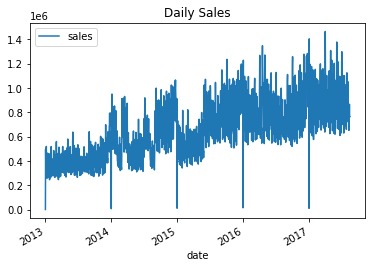

In [5]:
##I just want to look at the whole dataset first in the most simplified version- which to me is the total 
##sales from all the stores & product families over the full time frame that the data covers
print(min(data.date), max(data.date))

timeSales = data[['date', 'sales']].groupby('date').sum()
timeSales.plot()
plt.title('Daily Sales')



It looks like we have data for about 4.5 years from January 1 2013 through mid 2017. The total sales for each day over those 4.5 years are plotted on the y axis. Daily sales seem to range between 200,000 and 1,400,000 units. There is a day each year where the sale are dramatically lower- I wonder if the date is the same each year. Lets see->

In [6]:
print('10 Lowest Total Sales Days')
print(timeSales.sort_values(by='sales')[0:10])
print('\n10 Highest Total Sales Days')
print(timeSales.sort_values(by='sales')[-10:])

monthSales = data[['year', 'month', 'sales']].groupby(['year','month']).sum()
monthSales = monthSales.sort_values(by='sales')


10 Lowest Total Sales Days
                    sales
date                     
2013-01-01    2511.618999
2014-01-01    8602.065404
2017-01-01   12082.500997
2015-01-01   12773.616980
2016-01-01   16433.394000
2013-01-24  247245.690995
2013-03-14  247541.420096
2013-01-10  258982.003049
2013-01-29  264488.818076
2013-06-27  266525.458966

10 Highest Total Sales Days
                   sales
date                    
2016-05-01  1.270121e+06
2016-04-17  1.271834e+06
2016-12-04  1.276195e+06
2016-12-23  1.282146e+06
2017-07-02  1.296379e+06
2017-05-01  1.306699e+06
2016-04-18  1.345921e+06
2017-06-04  1.376512e+06
2017-01-02  1.402306e+06
2017-04-01  1.463084e+06


The lowest selling days of the year is clearly January 1st! Each year from 2013-2017 had its least amount of sales on the first of the year. The highest day of sales for 2013, 2014, 2015 & 2016 (4/5 of the years) occured in February - 2017 had its highest sales in August so far(the year is not complete in the data). 

Below I chose to look at the "signal" of the sales over time decomposed by seasonality. The trend plot shows that since 2013 the daily sales have been gradually increasing- maybe due to inflation?

Number of Days Included in Data:  1684


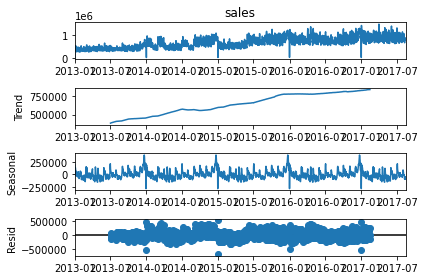

In [7]:
from statsmodels.tsa.seasonal import seasonal_decompose
data_copy = data.copy()
data_copy.index = pd.DatetimeIndex(data.date, freq=None)
data_copy = data_copy.drop('date', axis = 1)
data_copy = data_copy.groupby(by='date').sum()
print('Number of Days Included in Data: ',len(data_copy))
dataSignal = data_copy['sales']
decompose_result_add = seasonal_decompose(dataSignal, model="additive", period = 365)

trend = decompose_result_add.trend
seasonal = decompose_result_add.seasonal
residual = decompose_result_add.resid

decompose_result_add.plot();

Below I plot the total sales per month over the course of 4.5 years. You can see that sales increase year over year. The last datapoint in 2017 for August is so low because that month is not complete in the data yet. Each year the most sales occur in December.

year           2013          2014          2015          2016          2017
month                                                                      
1      1.032762e+07  1.891164e+07  1.489692e+07  2.397780e+07  2.632816e+07
2      9.658960e+06  1.203835e+07  1.374240e+07  2.194741e+07  2.325011e+07
3      1.142850e+07  2.036558e+07  1.559861e+07  2.313178e+07  2.670402e+07
4      1.099346e+07  1.286125e+07  1.495507e+07  2.596303e+07  2.589531e+07
5      1.159770e+07  1.337979e+07  1.773037e+07  2.477943e+07  2.691185e+07
6      1.168934e+07  1.331996e+07  2.161536e+07  2.220922e+07  2.568282e+07
7      1.125740e+07  1.942189e+07  2.220962e+07  2.346267e+07  2.701148e+07
8      1.173779e+07  1.388518e+07  2.296367e+07  2.245241e+07  1.243332e+07
9      1.179293e+07  2.002242e+07  2.324088e+07  2.241745e+07           NaN
10     1.177562e+07  2.039610e+07  2.387827e+07  2.403039e+07           NaN
11     1.235656e+07  2.053164e+07  2.280495e+07  2.464264e+07           NaN
12     1.580

Text(0, 0.5, 'Monthly Sales - # of Units Sold')

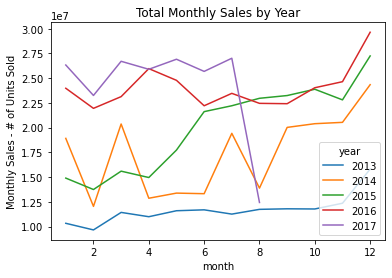

In [8]:
monthSales = data[['year','month', 'sales']].groupby(['year', 'month'], as_index = False).sum()
# pivot the data into the correct shape
monthSales = monthSales.pivot(index='month', columns='year', values='sales')
print(monthSales)
monthSales.plot()#, color = 'year')
plt.title('Total Monthly Sales by Year')
plt.ylabel('Monthly Sales - # of Units Sold')

There is not a very clear trend in the total sales each month that occurs with a period of 1 year. It does look like there is a clear increase in sales at the end of the year in November and December. Next, I will make pretty much the same plot but for days of the month.



Text(0, 0.5, 'Daily Sales - # of Units Sold')

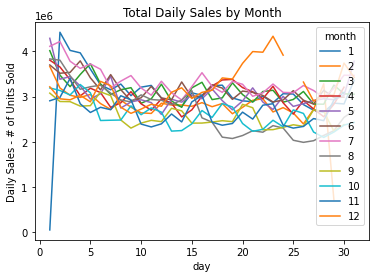

In [9]:
daySales = data[['month','day','sales']].groupby(['month','day'], as_index = False).sum()
# pivot the data into the correct shape
daySales = daySales.pivot(index='day', columns='month', values='sales')
#daySales = daySales[daySales.sales >= 2e6]
daySales.plot()
plt.title('Total Daily Sales by Month')
plt.ylabel('Daily Sales - # of Units Sold')

# Supplemental Datasets EDA & Cleaning

**Explore & Clean Additional Datasets**


**Sales by product Family**

There are 33 product families in the data that you can see printed below in order from least to most total sales.

In [10]:
productSales = data[['sales', 'family']].groupby(by='family', as_index=False).sum()
productSales = productSales.sort_values(by='sales')
print(productSales)

storeSales = data[['sales', 'store_nbr']].groupby(by='store_nbr', as_index=False).sum()
storeSales = storeSales.sort_values(by='sales')
print(storeSales)

typeSales = storeSales.merge(stores, on = 'store_nbr')
typeSales = typeSales[['sales', 'type']].groupby(by='type', as_index=False).sum()
typeSales = typeSales.sort_values(by='sales')
print(typeSales)

                        family         sales
4                        BOOKS  6.438000e+03
1                    BABY CARE  1.005100e+04
17             HOME APPLIANCES  4.160100e+04
14                    HARDWARE  1.034700e+05
23                   MAGAZINES  2.663590e+05
31  SCHOOL AND OFFICE SUPPLIES  2.693160e+05
2                       BEAUTY  3.378930e+05
26                PET SUPPLIES  3.565840e+05
20             LAWN AND GARDEN  5.488420e+05
0                   AUTOMOTIVE  5.548220e+05
27     PLAYERS AND ELECTRONICS  5.626080e+05
19                  LADIESWEAR  6.511590e+05
21                    LINGERIE  6.531140e+05
6                  CELEBRATION  7.611770e+05
16         HOME AND KITCHEN II  1.520670e+06
15          HOME AND KITCHEN I  1.861491e+06
13                  GROCERY II  1.962767e+06
32                     SEAFOOD  2.015432e+06
22            LIQUOR,WINE,BEER  7.746640e+06
29              PREPARED FOODS  8.799895e+06
11                FROZEN FOODS  1.407389e+07
10        

The lowest selling product families are Books, Baby Care and Home Appliances. The highest selling product families are Produce, Beverages & Grocery I.

Next, I want to ensure that there are no gaps in the data- i.e. there is data for every date between the first and last dates included.

In [11]:
data_copy
print('Dates missing from index are: ')
print(pd.date_range(start="2013-01-01", end="2017-08-15").difference(data_copy.index), '\n')
##Looks like Christmas(12/25) is missing for 2013-2016


##Lets put these days in the data with 0 for sales - because that is really what they are- they didnt sell anything!
missing = pd.date_range(start="2013-01-01", end="2017-08-15").difference(data_copy.index)
to_add = pd.DataFrame(columns = data.columns)
for date in missing:
    for family in data.family.unique().tolist():
        for store in data.store_nbr.unique().tolist():
            to_add.loc[len(to_add.index)] = [date, store, family, 0, 0, date.year, date.month, data.day] 
data = data.append(to_add)
print(rf'Missing Dates Imputed - 4/{len(data_copy.index.unique())}')
print(rf'New Length of Data - {len(data)}')

Dates missing from index are: 
DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None) 

Missing Dates Imputed - 4/1684
New Length of Data - 3008016


1218
Index(['date', 'dcoilwtico'], dtype='object')
date          datetime64[ns]
dcoilwtico           float64
dtype: object
date          0
dcoilwtico    1
dtype: int64


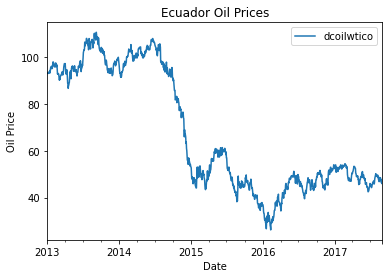

In [12]:
##Merge in Oil Prices on that date
oil['date'] = pd.to_datetime(oil['date'])
oil = oil.interpolate()
print(len(oil))
print(oil.columns)
print(oil.dtypes)
print(oil.isna().sum(axis=0))

oil.plot(x='date', label='Oil Price')
plt.title('Ecuador Oil Prices')
plt.xlabel('Date')
plt.ylabel('Oil Price')
plt.show()
plt.close()
##Convert 

There are 54 stores, all in Ecuador, included in the dataset. Each store is identified by a unique store_nbr which is an integer between 1-54. Additional features are city, state, type of store and cluster of stores. I think I would like to use some of this data later on- especially cluster and type. I will make both of these categorical columns in my dataset.

In [13]:
##Stores Dataset
print(stores)
stores['type'] = stores['type'].astype('category')
stores['cluster'] = stores['cluster'].astype('category')

print('\n',stores.dtypes)

    store_nbr           city                           state type  cluster
0           1          Quito                       Pichincha    D       13
1           2          Quito                       Pichincha    D       13
2           3          Quito                       Pichincha    D        8
3           4          Quito                       Pichincha    D        9
4           5  Santo Domingo  Santo Domingo de los Tsachilas    D        4
5           6          Quito                       Pichincha    D       13
6           7          Quito                       Pichincha    D        8
7           8          Quito                       Pichincha    D        8
8           9          Quito                       Pichincha    B        6
9          10          Quito                       Pichincha    C       15
10         11        Cayambe                       Pichincha    B        6
11         12      Latacunga                        Cotopaxi    C       15
12         13      Latacu

I am only going to use the data for the national holiday events. I will have a column in the full dataframe that is a boolean value for whether a value is a holiday or not.

In [14]:
##Holiday Events
##Merge on Date else 

holidays = holiday_events[holiday_events["locale"] == 'National']
holidays = holidays[holidays['transferred']==False]
holidays = holidays[holidays['type'] != 'Additional']
holidays['date'] = pd.to_datetime(holidays['date'])
holidays = holidays.sort_values(by='date')

print('Number of National Holidays in Dataset:', len(holidays))


print(holidays)
print('\n',holidays.dtypes)

Number of National Holidays in Dataset: 126
          date      type    locale locale_name  \
14  2012-08-10   Holiday  National     Ecuador   
20  2012-10-12  Transfer  National     Ecuador   
21  2012-11-02   Holiday  National     Ecuador   
22  2012-11-03   Holiday  National     Ecuador   
35  2012-12-24    Bridge  National     Ecuador   
..         ...       ...       ...         ...   
325 2017-08-11  Transfer  National     Ecuador   
331 2017-10-09   Holiday  National     Ecuador   
332 2017-11-02   Holiday  National     Ecuador   
333 2017-11-03   Holiday  National     Ecuador   
348 2017-12-25   Holiday  National     Ecuador   

                                description  transferred  
14            Primer Grito de Independencia        False  
20      Traslado Independencia de Guayaquil        False  
21                          Dia de Difuntos        False  
22                  Independencia de Cuenca        False  
35                           Puente Navidad        False  
.

# Merge Extra Datasets into Main Dataframe

To join:<br>
    -Holidays[date] left join on date (1 if holiday 0 if not)<br>
    -Stores, join on store_nbr<br>
    -Oil, join on date<br>

In [15]:
##Add Holiday Boolean Column
holidays['hday'] = 1
hdays = holidays[['date', 'hday']]
dataHol = data.merge(hdays, how='left', on='date')
dataHol['holiday'] = np.where(dataHol['hday']== 1, 1, 0)
dataHol = dataHol.drop(['hday'], axis = 1)
#print(len(dataHol[dataHol['holiday']==1]))
#print(len(dataHol[dataHol['holiday']==0]))
dataHol['month'] = dataHol['month'].astype(int)
dataHol['year'] = dataHol['year'].astype(int)
dataHol['day'] = dataHol.date.dt.day
print(dataHol.dtypes)

##Add Oil Price for Each Date
dataOil = dataHol.merge(oil, how='left', on='date')
#print(dataOil.holiday.unique())

##Add Store Info
dataFull = dataOil.merge(stores[['store_nbr','type','cluster']], how='left', on='store_nbr')
#print(dataFull.holiday.unique())


print('\nNull Values by Column')
print(dataFull.isna().sum(axis=0))
print('\nPercentage of Null values in Oil Prices', (928422/3000887)*100, '\n')

dataFull['dcoilwtico'] = dataFull.dcoilwtico.interpolate(method='nearest')

#Fix Datatypes
dataFull['day'] = dataFull['day'].astype('category')
#Order Family of products from most sales to least sales
c = dataFull['family'].astype('category')
dataFull['family'] = c
dataFull['family'] = dataFull['family'].cat.reorder_categories(productSales['family'].tolist(), ordered=True)
dataFull['family'] = dataFull['family'].cat.codes
#Change Sales to float
dataFull['sales'] = dataFull['sales'].astype(float)
#Onpromotion as int
dataFull['onpromotion'] = dataFull['onpromotion'].astype(int)
#Holiday as category
dataFull['holiday'] = dataFull['holiday'].astype('category')
#store_nbr to categorical integer
dataFull['store_nbr'] = dataFull['store_nbr'].astype(int)
#Order Stores from most sales to least sales
dataFull['store_nbr'] = dataFull['store_nbr'].astype('category')
dataFull['store_cat'] = dataFull['store_nbr'].cat.reorder_categories(storeSales['store_nbr'].tolist(), ordered=True)
dataFull['store_cat'] = dataFull['store_cat'].cat.codes
#Order Store Types from most sales to least sales
dataFull['type'] = dataFull['type'].astype('category')
dataFull['type'] = dataFull['type'].cat.reorder_categories(typeSales['type'].tolist(), ordered=True)
dataFull['type'] = dataFull['type'].cat.codes


#print(rf'Rows of Full Data after dropping NaNs: {len(dataFull)}')
print('\nNull Values by Column')
print(dataFull.isna().sum(axis=0), '\n')
print(dataFull.dtypes)
print(dataFull.holiday.unique())


date           datetime64[ns]
store_nbr              object
family                 object
sales                  object
onpromotion            object
year                    int64
month                   int64
day                     int64
holiday                 int64
dtype: object

Null Values by Column
date                0
store_nbr           0
family              0
sales               0
onpromotion         0
year                0
month               0
day                 0
holiday             0
dcoilwtico     864270
type                0
cluster             0
dtype: int64

Percentage of Null values in Oil Prices 30.938252589984227 


Null Values by Column
date              0
store_nbr         0
family            0
sales             0
onpromotion       0
year              0
month             0
day               0
holiday           0
dcoilwtico     3564
type              0
cluster           0
store_cat         0
dtype: int64 

date           datetime64[ns]
store_nbr            categ

In [16]:
##Reshape/Format Full Dataset

#Make Date column the index
dataFull = dataFull.sort_values(by='date')

#Add Time Order since beginning column
justDates = pd.DataFrame(dataFull.date.unique()).sort_values(by=0)
justDates['date'] = justDates[0]
justDates['time'] = np.arange(len(justDates))
dataFull = dataFull.merge(justDates, on='date')

dataFull.index = dataFull['date']
dataFull = dataFull.drop('date', axis = 1)
dataFull = dataFull.sort_values('time')
dataFull['oil'] = dataFull['dcoilwtico']
dataFull = dataFull.drop(['dcoilwtico',0], axis = 1)


**FEATURES IN FULL CLEANED/MERGED DATASET**<br>
These are the target and features that I have to choose from for using to train my model.<br>
**Target**: <br>
    sales - Float<br>
**Features kept**: 7<br>
    store_nbr - Categorical Integer<br>
    family - Categorical String<br>
    onpromotion - Integer<br>
    year - Categorical Integer<br>
    month - Categorical Integer<br>
    day - Categorical Integer<br>
    holiday - Boolean<br>
    type - Categorical String<br>
    cluster - Categorical Integer<br>
    time - Integer<br>
    oil - float<br>

# Linear Regression

I start below with simple linear regression and plan to build/improve from there by optimizing parameters and features to use. 

Throughout the rest of the project I will evaluate the accuracy of my models using the following error metrics along with the R2 value of the model. 

**Error Evaluation Metrics** <br>
    MSE = mean((y_pred - y_test)^2)<br>
    RMSE = sqrt(mean((y_pred - y_test)^2)<br>
    RMSLE = sqrt(mean(log(y_pred - y_test)^2) *Priority Metric<br>

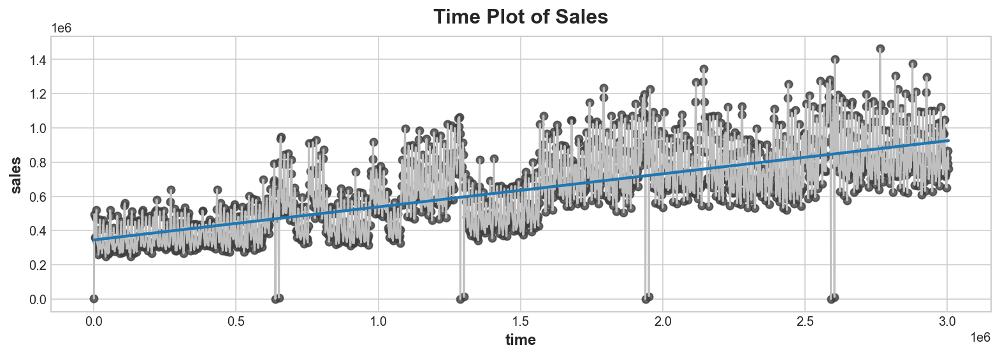

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

fullSales = dataFull.groupby(by=dataFull.index).sum()
fullSales = fullSales.sort_values(by='time')[:-3]
#print(fullSales.tail())
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots()
ax.plot(fullSales.time, fullSales.sales, color='0.75')
ax = sns.regplot(x='time', y='sales', data=fullSales, ci=None, scatter_kws=dict(color='0.25'))
ax.set_title('Time Plot of Sales');


Like I already saw earlier in my analysis- there is a trend in the total amount of sales over the course of the 4.5 years which in the plot above is the x axis but indexed for each day in those 4.5 years. I used regplot to fit a line to the data. This makes me think that time will be a useful feature to use in my model.

Below I use linear regression to create a model using only the time feature to predict sales.

In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tools.eval_measures import rmse
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.metrics import mean_absolute_error, mean_squared_log_error

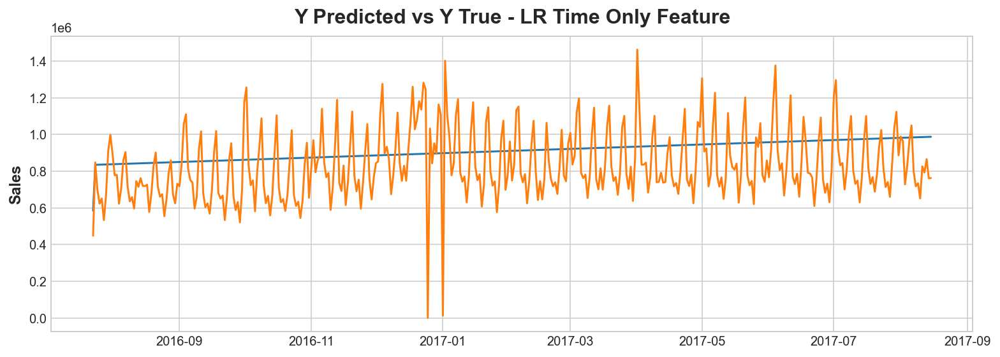

In [19]:
# Training data
X = dataFull.loc[:, ['time']]  # features
y = dataFull.loc[:, 'sales']  # target

X_train, X_test, y_train, y_test = train_test_split(
X, y, test_size=.23,shuffle=False)
#print(y_test)
#print(y_train)
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Store the fitted values as a time series with the same time index as
# the training data
y_pred = pd.Series(model.predict(X_test), index=X_test.index)
#print(y_pred.groupby(by = y_pred.index).sum())
#print(y_test.groupby(by = y_test.index).sum())
plt.plot(y_pred.groupby(by = y_pred.index).sum())
plt.plot(y_test.groupby(by = y_test.index).sum())
plt.ylabel('Sales')
plt.title('Y Predicted vs Y True - LR Time Only Feature')
plt.show()

# Multiple Linear Regression

Below are a few implementations of different version of linear regression. I started with a simple one feature linear regression using the time column that I created earlier during data cleaning. I began with testing the sklearn LinearRegression() model but switched to 

**Error Evaluation Metrics** <br>
    MSE = mean((y_pred - y_test)^2)<br>
    RMSE = sqrt(mean((y_pred - y_test)^2)<br>
    RMSLE = sqrt(mean(log(y_pred - y_test)^2) *Priority Metric<br>

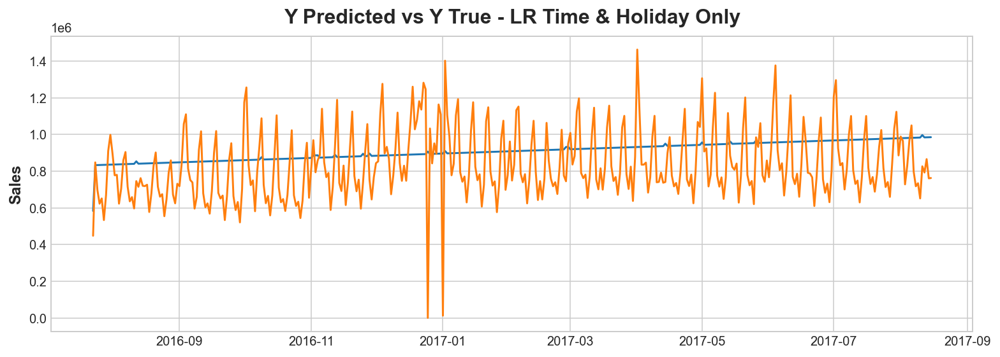

MSE:  1785776.0291123667
RMSE:  1336.329311626579
R2:  -0.0008330586517391048
RMSLE:  3.7532740683306063
Mean Difference between True Sales & Prediction 682.5140182541408
180.0496026384634 [0.22101406 7.39110636] -0.0008330586517391048


In [20]:
##Add features 

# Training data
X1 = dataFull.loc[:, ['time', 'holiday']]  # features
y1 = dataFull.loc[:, 'sales']  # target
#print(dataFull[dataFull['holiday']==True])
#print(X1[X1['holiday']==1])
#print(X1[X1['holiday']==0])


X1_train, X1_test, y1_train, y1_test = train_test_split(
X1, y1, test_size=.23,shuffle=False)
#print(X1_test['holiday'].unique())
#print(X1_train['holiday'].unique())
#print(y_train)
# Train the model
model = LinearRegression()
model.fit(X1_train, y1_train)

# Store the fitted values as a time series with the same time index as
# the training data
y1_pred = pd.Series(model.predict(X1_test), index=X1_test.index)
#print(y1_pred.groupby(by = y1_pred.index).sum())
#print(y1_test.groupby(by = y1_test.index).sum())
plt.plot(y1_pred.groupby(by = y1_pred.index).sum())
plt.plot(y1_test.groupby(by = y1_test.index).sum())
plt.ylabel('Sales')
plt.title('Y Predicted vs Y True - LR Time & Holiday Only')
plt.show()

# predict on test data
y_pred = model.predict(X1_test)
y_pred = [0 if i < 0 else i for i in y1_pred]

# evaluate predictions
print('MSE: ', mean_squared_error(y1_test, y_pred))
print('RMSE: ',rmse(y1_test, y_pred))
print('R2: ', r2_score(y1_test, y_pred))
print('RMSLE: ', np.sqrt(np.mean(np.square(np.log1p(y_pred) - np.log1p(y1_test)))))
y_diff = [a_i - b_i for a_i, b_i in zip(y1_test, y_pred)]
y_diff = [abs(x) for x in y_diff]
print( 'Mean Difference between True Sales & Prediction', np.mean(y_diff))
print(model.intercept_, model.coef_, model.score(X1_test, y1_test))

I used the box of code below to complete multiple iterations of LinearRegression using different feature combinations and scored them. I switched to try implementing a similar model available with sklearn **Ridge()**. Ridge has more hyperparameters which I would like to try optimizing to see if I get better or worse results than LinearRegression().

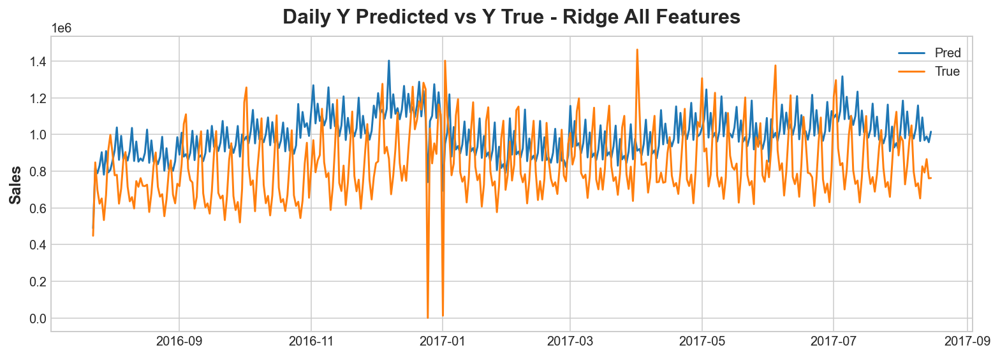

MSE:  1014035.4513024449
RMSE:  1006.9932727195574
R2:  0.4316867368788815
RMSLE:  2.2381207407381423
Mean Difference between True Sales & Prediction 464.4205342552431
-797.2063796350158 [ 0.114326   -8.63300704 23.44273467 12.20273972 -0.29311891  5.26304294
 -1.47579818 42.97839255  2.0806782 ] 0.4232064343913604


In [21]:

##Add features 
dataFull['oil'] = dataFull['oil'].fillna(0)
#print(dataFull.dtypes)
# Training data
X1 = dataFull.loc[:, ['time', 'holiday', 'onpromotion', 'store_cat', 'oil', 'month', 'day', 'family', 'cluster']] 
#print(dataFull.day.unique())# features
#print(dataFull.month.unique())# features


y1 = dataFull.loc[:, 'sales']  # target
#print(dataFull[dataFull['holiday']==True])
#print(X1[X1['holiday']==1])
#print(X1[X1['holiday']==0])


X1_train, X1_test, y1_train, y1_test = train_test_split(
X1, y1, test_size=.23,shuffle=False)
#print(X1_test['holiday'].unique())
#print(X1_train['holiday'].unique())
#print(y_train)
# Train the model
model = Ridge(alpha=1.0)
model.fit(X1_train, y1_train)
#print(y1_train)
# Store the fitted values as a time series with the same time index as
# the training data
y1_pred = pd.Series(model.predict(X1_test), index=X1_test.index)
#print(y1_pred.groupby(by = y1_pred.index).sum())
#print(y1_test.groupby(by = y1_test.index).sum())
plt.plot(y1_pred.groupby(by = y1_pred.index).sum(), label = 'Pred')
plt.plot(y1_test.groupby(by = y1_test.index).sum(), label = 'True')
plt.legend()
plt.ylabel('Sales')
plt.title('Daily Y Predicted vs Y True - Ridge All Features')
plt.show()

# predict on test data
y1_pred = [0 if i < 0 else i for i in y1_pred]
y_diff = [a_i - b_i for a_i, b_i in zip(y1_test, y1_pred)]
y_diff = [abs(x) for x in y_diff]

# evaluate predictions
print('MSE: ', mean_squared_error(y1_test, y1_pred))
print('RMSE: ',rmse(y1_test, y1_pred))
print('R2: ', r2_score(y1_test, y1_pred))
print('RMSLE: ', np.sqrt(np.mean(np.square(np.log1p(y1_pred) - np.log1p(y1_test)))))
print( 'Mean Difference between True Sales & Prediction', np.mean(y_diff))
print(model.intercept_, model.coef_, model.score(X1_test, y1_test))

Including all features improves my evaluation metrics significantly (RMSLE & R2 are the main two I am basing decision off of). The next step is optimizing my values for alpha, and which features to include.

In [22]:
#sns.pairplot(dataFull, diag_kind = 'kde')
#plt.title('Votes Pair Plot')
#plt.show()

**Optimize SkLearn Ridge**

Below I find the best results based on my evaluation metrics from models for alpha = 0-50, # features = 1-all, and each solver available for the Ridge() model. 

**Select Best Features**<br>

I used sklearn SelectKBest() to select features during optimization. I give SelectKBest() the number of features to pick and it returns which features to use in that iteration of the Ridge() model.

You can see above that I manually went through some features that I thought would be most useful and created a few models with those features. What you do not see here that I also did was a a version of **Forward Stepwise Refinement** similar to what we did in Week 2 HW assignment. I tried using stats models and including interactions between features but got much lower R2 that I am seeing with SKlearn LinearRegression() and Ridge() -  so I stuck with that method. You can see some scrap code of my previous implementions at the very end of this notebook.

In [23]:
train = X1_train
train['sales'] = y1_train.tolist()

##Loop through each combination of each item in the three lists below- Alpha, # Features & Solver
#for k in range(1,len(train.columns)-1):
#for solver in ['sparse_cg', 'cholesky', 'svd', 'lsqr', 'sag','saga']:
#for alpha in range(1, 10):
#Chose best for each- see plots in report
metrics = pd.DataFrame(columns = ['r2', 'mse', 'rmse', 'rmsle', 'k', 'alpha', 'solver'])
row = 0

for k in range(1,len(train.columns)-1):
    for solver in ['sparse_cg', 'cholesky', 'svd', 'lsqr', 'sag','saga']:
        for alpha in range(1, 50):
            X_new = SelectKBest(f_regression, k=k)
            X_new.fit(X1_train, y1_train)
            cols_idxs = X_new.get_support(indices=True)
            #print(cols_idxs)
            #print(X1_train.columns)
            #cols_idxs = [0,2,3,5,7,6,1]
            X2_train = X1_train.iloc[:,cols_idxs]
            X2_test = X1_test.iloc[:,cols_idxs]
            #print('Cols: ', X1_train.columns[cols_idxs], ' \nAlpha: ', alpha, ' Solver: ', solver)
            model = Ridge(alpha = alpha, solver = solver)
            model.fit(X2_train, y1_train)

            # predict on test data
            y_pred = model.predict(X2_test)
            y_pred = [0 if i < 0 else i for i in y_pred]

            # evaluate predictions
            metrics.at[row,'mse'] = mean_squared_error(y1_test, y_pred)
            metrics.at[row, 'rmse'] = rmse(y1_test, y_pred)
            metrics.at[row, 'r2'] = r2_score(y1_test, y_pred)
            metrics.at[row, 'rmsle'] = np.sqrt(np.mean(np.square(np.log1p(y_pred) - np.log1p(y1_test))))
            metrics.at[row,'k'] = k
            metrics.at[row, 'solver'] = solver
            metrics.at[row, 'alpha'] = alpha
            row += 1

Done
         r2             mse         rmse     rmsle  k alpha     solver
0  0.214586  1401406.697006  1183.810245  2.077116  1     1  sparse_cg
1  0.214586  1401406.698270  1183.810246  2.077116  1     2  sparse_cg
2  0.214586  1401406.699534  1183.810246  2.077116  1     3  sparse_cg
3  0.214586  1401406.700799  1183.810247  2.077116  1     4  sparse_cg
4  0.214586  1401406.702063  1183.810247  2.077116  1     5  sparse_cg


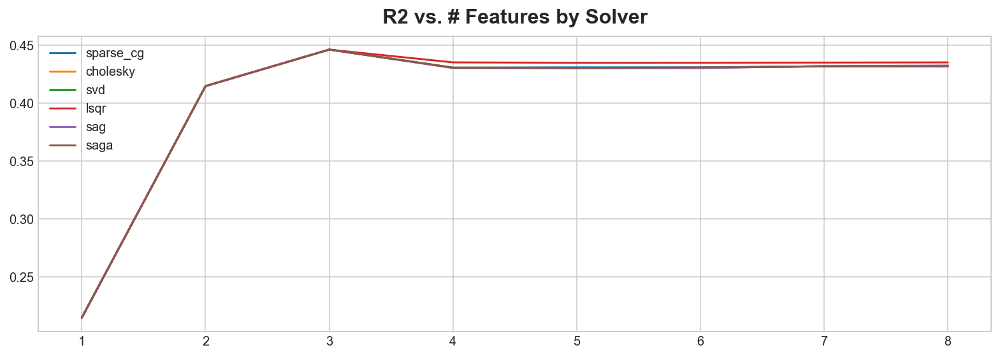

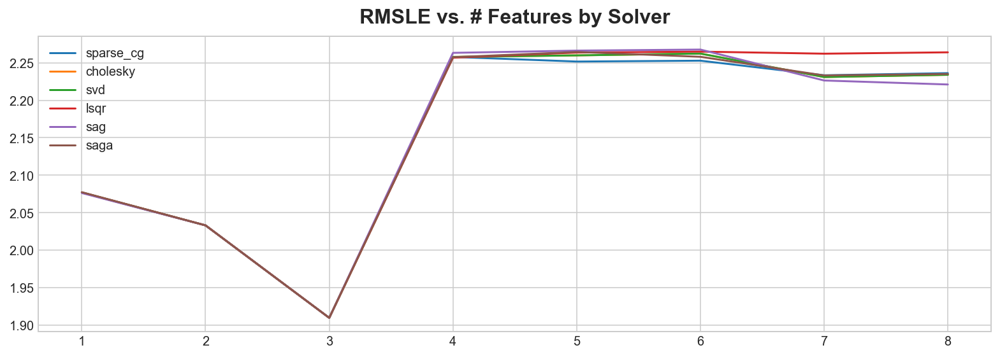

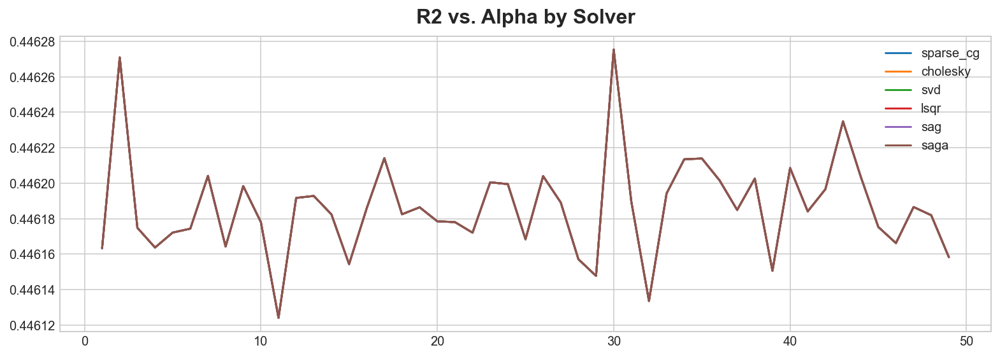

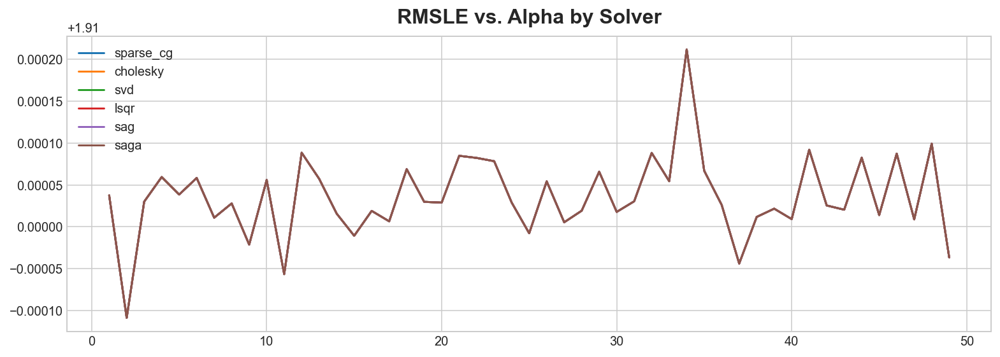

Best R2:  0.44674219057420717
Best RMSE:  993.5653786650146
Best MSE:  987172.1616817537
Best RMSLE:  1.9092209278816723
Mean Difference between True Sales & Prediction 468.10762143450097


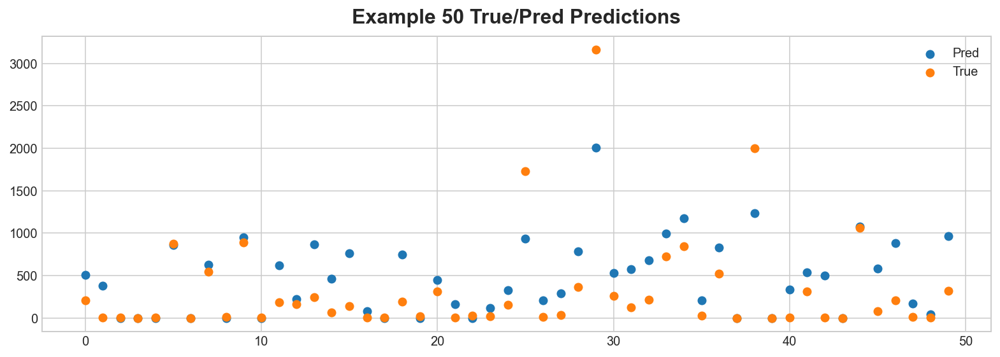

In [24]:
for solver in ['sparse_cg', 'cholesky', 'svd', 'lsqr', 'sag','saga']:
    toplot = metrics[metrics.solver == solver]
    toplot['r2'] = toplot.r2.astype(float)
    r2plot = toplot[['r2', 'k']].groupby(by='k').mean()
    plt.plot(r2plot.index, r2plot.r2 ,label = solver)
plt.legend()
plt.title('R2 vs. # Features by Solver')
plt.show()

for solver in ['sparse_cg', 'cholesky', 'svd', 'lsqr', 'sag','saga']:
    toplot = metrics[metrics.solver == solver]
    toplot['rmsle'] = toplot.rmsle.astype(float)
    rmplot = toplot[['rmsle', 'k']].groupby(by='k').mean()
    plt.plot(rmplot.index, rmplot.rmsle ,label = solver)
plt.legend()
plt.title('RMSLE vs. # Features by Solver')
plt.show()


for solver in ['sparse_cg', 'cholesky', 'svd', 'lsqr', 'sag','saga']:
    toplot = metrics[metrics.k == 3]
    toplot['r2'] = toplot.r2.astype(float)
    raplot = toplot[['r2', 'alpha']].groupby(by='alpha').mean()
    plt.plot(raplot.index, raplot.r2 ,label = solver)
plt.legend()
plt.title('R2 vs. Alpha by Solver')
plt.show()

for solver in ['sparse_cg', 'cholesky', 'svd', 'lsqr', 'sag','saga']:
    toplot = metrics[metrics.k == 3]
    toplot['rmsle'] = toplot.rmsle.astype(float)
    rmaplot = toplot[['rmsle', 'alpha']].groupby(by='alpha').mean()
    plt.plot(rmaplot.index, rmaplot.rmsle ,label = solver)
plt.legend()
plt.title('RMSLE vs. Alpha by Solver')
plt.show()

print('Best R2: ', max(metrics.r2))
print('Best RMSE: ', min(metrics.rmse))
print('Best MSE: ', min(metrics.mse))
print('Best RMSLE: ', min(metrics.rmsle))

y_diff = [a_i - b_i for a_i, b_i in zip(y1_test, y_pred)]
y_diff = [abs(x) for x in y_diff]
print( 'Mean Difference between True Sales & Prediction', np.mean(y_diff))


plt.scatter(x = range(len(y_pred[50:100])), y=y_pred[50:100], label = 'Pred')
plt.scatter(x = range(len(y_pred[50:100])), y=y1_test[50:100], label = 'True')
plt.legend()
plt.title('Example 50 True/Pred Predictions')
plt.show()

Based on these results - I have chosen to use only 3 features (K = 3): onpromotion, store_cat & family. These were chosen by sklearns SelectKBest() function which selects the best K features in your data. The solver did not make much of a difference on the R2 or RMSLE which are my main evaluation metrics. I will use the following parameters in my final Ridge model:

K = 3 #Num Features <br>
Alpha = 15<br>
Solver = 'sag'

After creating and evaluating the Ridge model I will do the same for LinearRegression and pick the best result as my final model.

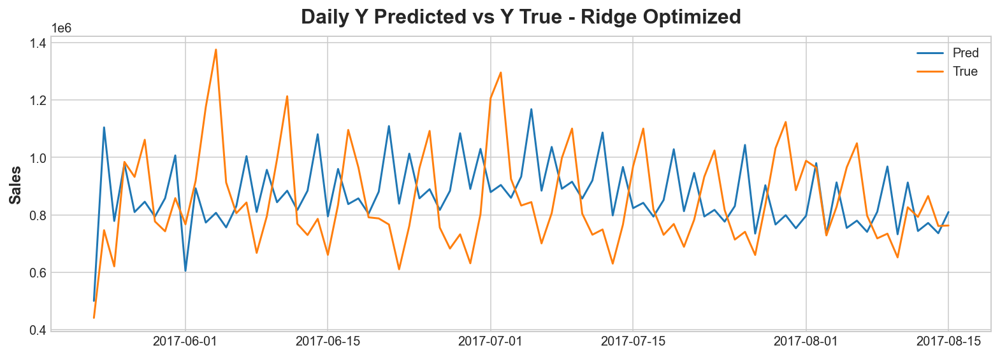

150579 150579
MSE:  979996.7430967663
RMSE:  989.9478486752554
R2:  0.4444863868010418
RMSLE:  1.7845137522337462
Mean Difference between True Sales & Prediction 419.3889384036295
-723.7362227362438 [41.97582918 28.83944748 12.63382494] 0.42864972468578566


In [36]:
X = dataFull.loc[:, dataFull.columns.tolist()]  # features
y = dataFull.loc[:, 'sales'] #Target

#Split Train and Test - I lowered to 5% of full set for Test because it is hard to evaluate results with so many in test
X_train, X_test, y_train, y_test = train_test_split(
X, y, test_size=.05 ,shuffle=False)

Xk = SelectKBest(f_regression, k=3)
Xk.fit(X_train, y_train)

cols_idxs = Xk.get_support(indices=True)
X_train = X_train.iloc[:,cols_idxs]
X_test = X_test.iloc[:,cols_idxs]

model = Ridge(alpha = 15, solver = 'sag')
model.fit(X_train, y_train)

# predict on test data
y_pred = pd.DataFrame(model.predict(X_test))
y_pred.index = y_test.index
plt.plot(y_pred.groupby(by = y_pred.index).sum(), label = 'Pred')
plt.plot(y_test.groupby(by = y_test.index).sum(), label = 'True')
plt.legend()
plt.ylabel('Sales')
plt.title('Daily Y Predicted vs Y True - Ridge Optimized')
plt.show()

y_pred = [0 if i < 0 else i for i in y_pred[0].tolist()]
print(len(y_test), len(y_pred))

#RMSE is being very slow for some reason- reimporting to make sure someting weird isnt going on with the variable name
from statsmodels.tools.eval_measures import rmse
# evaluate predictions
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)
print('RMSE: ',mse**.5)
print('R2: ', r2_score(y_test, y_pred))
print('RMSLE: ', np.sqrt(np.mean(np.square(np.log1p(y_pred) - np.log1p(y_test)))))
y_diff = [a_i - b_i for a_i, b_i in zip(y_test, y_pred)]
y_diff = [abs(x) for x in y_diff]
print( 'Mean Difference between True Sales & Prediction', np.mean(y_diff))
print(model.intercept_, model.coef_, model.score(X_test, y_test))


# FINAL MODEL

SkLearn LinearRegression() with 3 Features ['onpromotion', 'store_cat', 'family'] chosen by SelectKBest.

Evaluation Metrics Below.


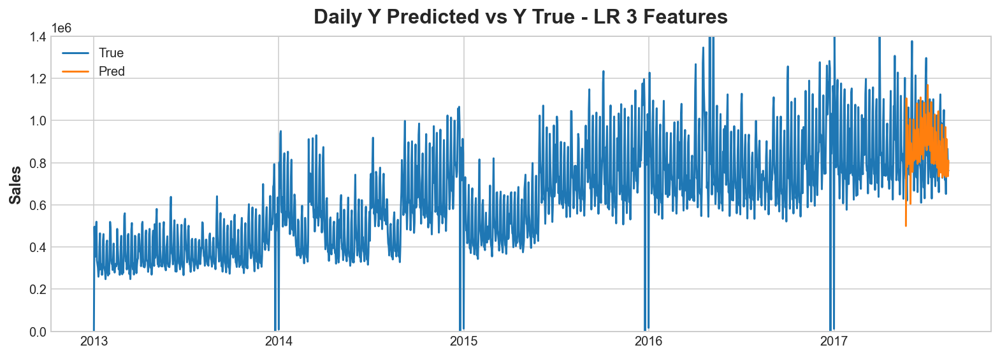

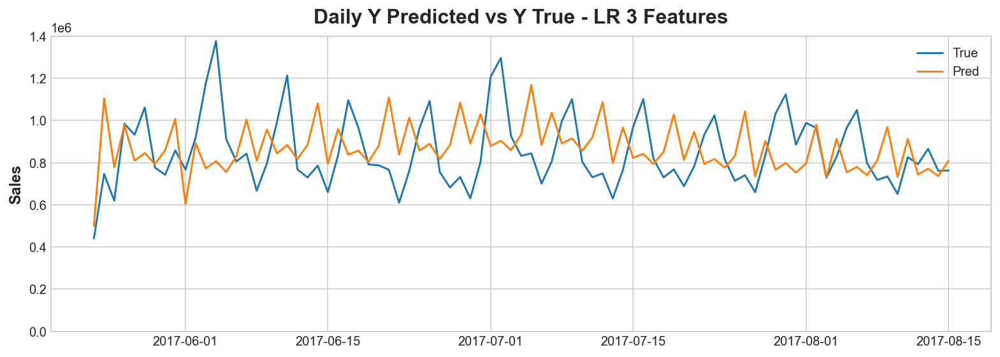

MSE:  980029.290327381
RMSE:  989.9642873999956
R2:  0.4444679373216882
RMSLE:  1.7846030090799532
Intercept:  -723.6516336941378 Coef:  [41.9677756  28.82867981 12.63645492] Score:  0.42863882543444


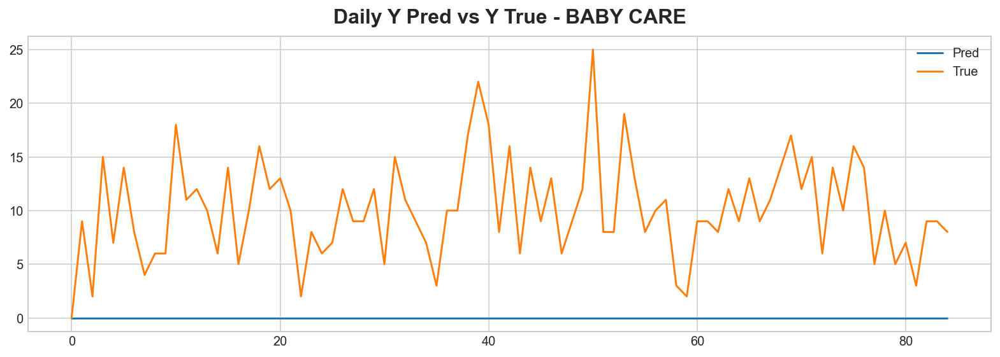

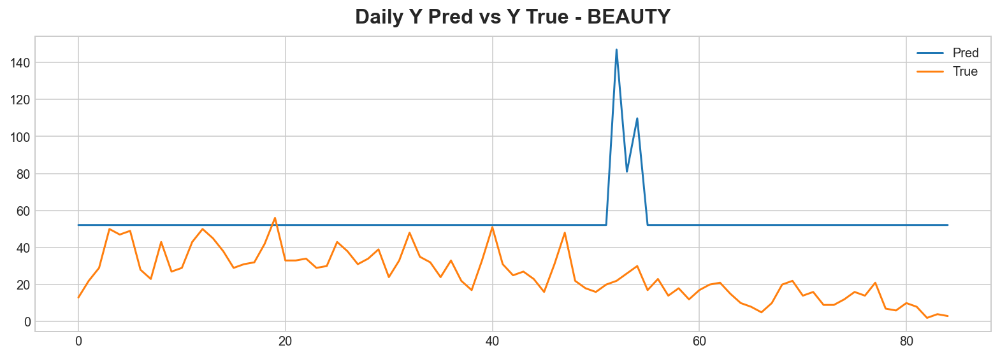

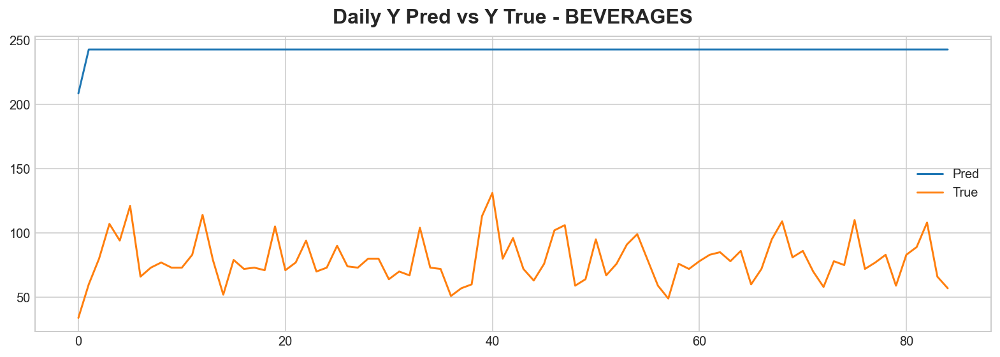

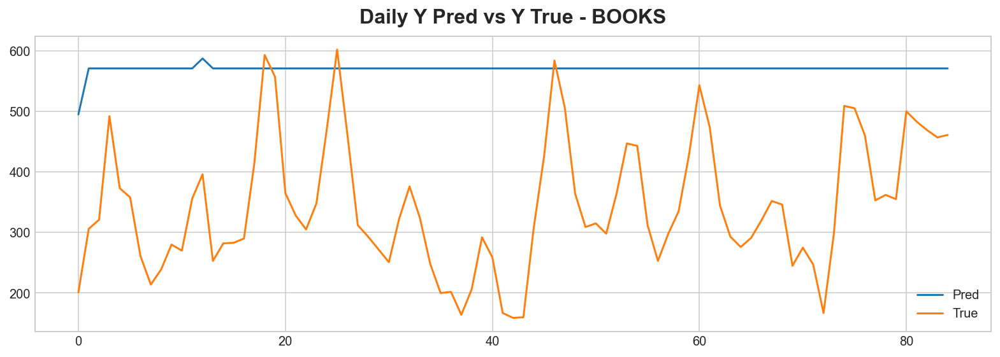

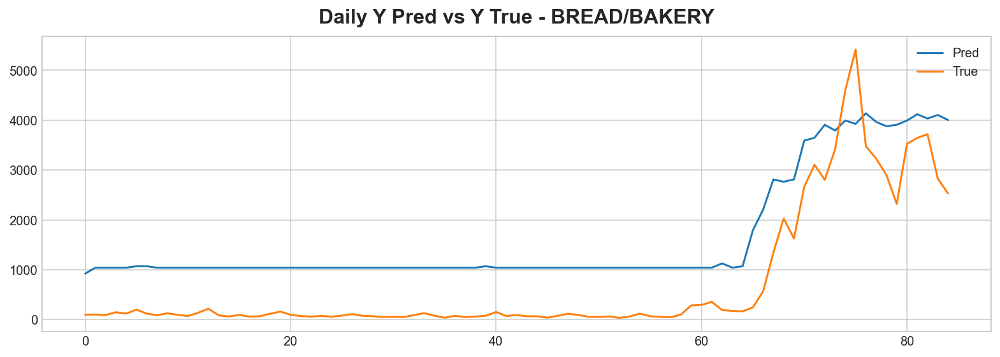

...

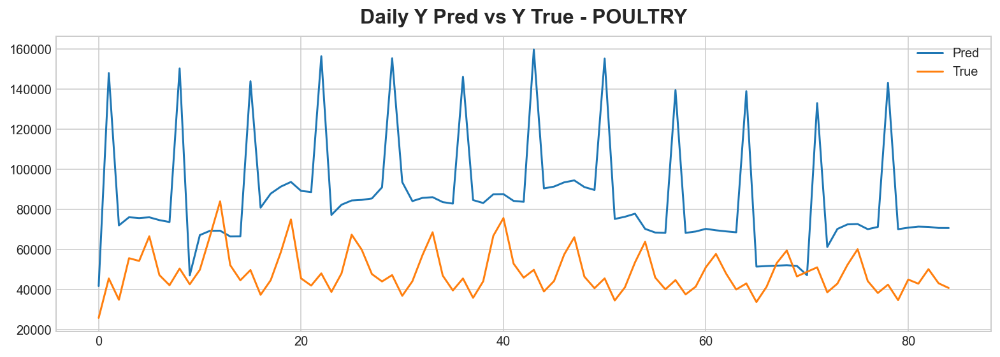

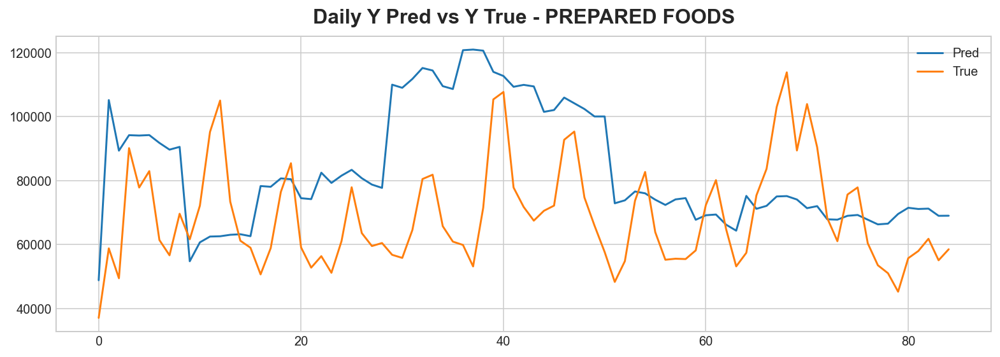

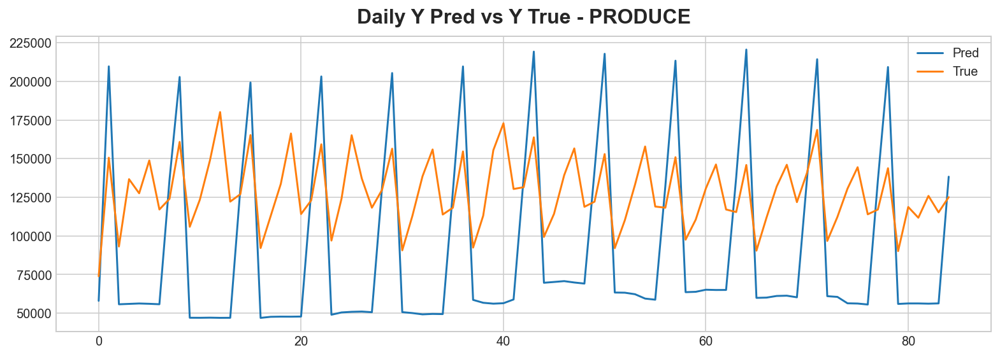

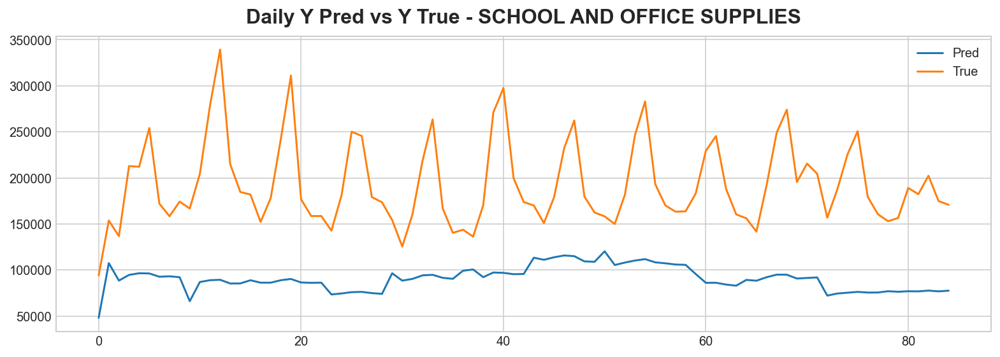

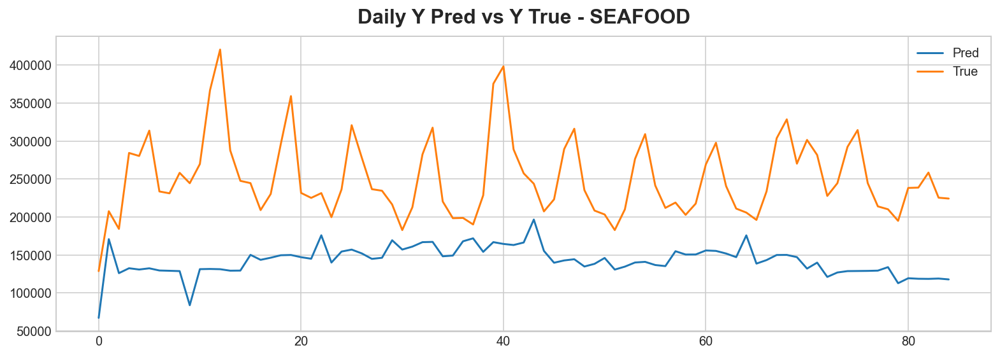

In [142]:
X = dataFull.loc[:, dataFull.columns.tolist()]  # features
y = dataFull.loc[:, 'sales'] #Target

#Split Train and Test - I lowered to 5% of full set for Test because it is hard to evaluate results with so many in test
X_train, X_test, y_train, y_test = train_test_split(
X, y, test_size=.05 ,shuffle=False)

Xk = SelectKBest(f_regression, k=3)
Xk.fit(X_train, y_train)

cols_idxs = Xk.get_support(indices=True)
X_train = X_train.iloc[:,cols_idxs]
X_test = X_test.iloc[:,cols_idxs]

model = LinearRegression()
model.fit(X_train, y_train)

# predict on test data
y_pred = pd.DataFrame(model.predict(X_test))
y_pred.index = y_test.index

plt.plot(y.groupby(by = y.index).sum(), label = 'True')
plt.plot(y_pred.groupby(by = y_pred.index).sum(), label = 'Pred')
plt.legend()
plt.ylabel('Sales')
plt.ylim(0, 1.4e6)
plt.title('Daily Y Predicted vs Y True - LR 3 Features')
plt.show()

plt.plot(y_test.groupby(by = y_test.index).sum(), label = 'True')
plt.plot(y_pred.groupby(by = y_pred.index).sum(), label = 'Pred')
plt.legend()
plt.ylabel('Sales')
plt.ylim(0, 1.4e6)
plt.title('Daily Y Predicted vs Y True - LR 3 Features')
plt.show()

y_pred = [0 if i < 0 else i for i in y_pred[0].tolist()]

#RMSE is being very slow for some reason- reimporting to make sure someting weird isnt going on with the variable name
from statsmodels.tools.eval_measures import rmse
# evaluate predictions
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)
print('RMSE: ',mse**.5)
print('R2: ', r2_score(y_test, y_pred))
print('RMSLE: ', np.sqrt(np.mean(np.square(np.log1p(y_pred) - np.log1p(y_test)))))
y_diff = [a_i - b_i for a_i, b_i in zip(y_test, y_pred)]
y_diff = [abs(x) for x in y_diff]
#plt.hist(y_diff, bins = 50)
#plt.show()
print('Intercept: ',model.intercept_, 'Coef: ',model.coef_, 'Score: ',model.score(X_test, y_test))


labelNames = dict(enumerate(c.cat.categories))
y_pred = pd.DataFrame(y_pred)
y_pred.index = y_test.index

for family in range(1,33):
    #fname = 
    ptest = y_test[X_test['family']==family].groupby(by='date').sum()
    ppred = y_pred[X_test['family']==family].groupby(by='date').sum()
    plt.plot(range(len(ppred)), ppred, label = 'Pred')
    plt.plot(range(len(ppred)), ptest, label = 'True')
    plt.legend()
    plt.title(rf'Daily Y Pred vs Y True - {labelNames[family]}')
    plt.show()

**How Well Did I predict the daily Sales? - Not by Product Family**

RMSLE:  0.2704214169493963
Mean Difference:  208834.2467471824  Mean True:  850473.2994619915  Mean Pred:  997709.1982925284


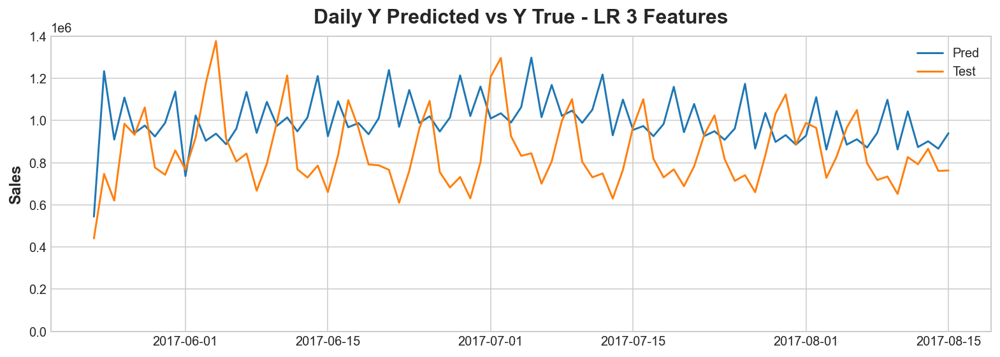

In [140]:
yday_pred = y_pred.groupby(by = y_pred.index).sum()
yday_pred['sales'] = yday_pred[0]

yday_test = y_test.groupby(by = y_test.index).sum()

mse = mean_squared_error(yday_test, yday_pred['sales'])
print('RMSLE: ', np.sqrt(np.mean(np.square(np.log1p(yday_pred['sales']) - np.log1p(yday_test)))))
yday_diff = [a_i - b_i for a_i, b_i in zip(yday_test, yday_pred['sales'])]
yday_diff = [abs(x) for x in yday_diff]
print('Mean Difference: ',np.mean(yday_diff), ' Mean True: ',np.mean(yday_test), ' Mean Pred: ', np.mean(yday_pred['sales']))

plt.close()
plt.plot(yday_pred['sales'], label = 'Pred')
plt.plot(yday_test, label = 'Test')
plt.legend()
plt.ylabel('Sales')
plt.ylim(0, 1.4e6)
plt.title('Daily Y Predicted vs Y True - LR 3 Features')
plt.show()

# Discussion & Conclusions

**Results**
My final model was a LinearRegression() from sklearn implemented with 3 features based on my results of SelectKBest(). The model resulted in a Root Mean Squared Log Error (RMSLE) of about 1.78 and R2 of .445. These are the two main evaluatiom metrics that I wanted to focus on- because the RMSLE is what is being used to judge the kaggle competition and I think that RMSLE(along with MSE and RMSE) are a good way to judge the amount of error in the predictions. 

In my final model I chose to also look at how close I was to predicting the sum of all of the product families - so the total sales for a given day. I found that for all of the test dataset (which I chose to be only 5% of the full data because of the large size), my predictions for the total amount of sales in a day 147,236 above the true average of 850,473 sales and I was almost always predicting above the true value. So on average I was 17% above in my predictions.

I was truthfully expecting better results, but I think that these are a good start at what I was trying to do. I think that this would give stores an idea of what to exoect in sales for a given product/day, but the model could still use improvement.

**Additional Work**

Weights
After completing the work above- I think that I should have included weights for the features potentially. I began to work on this but I will not be able to finish that work before turning in my assignmnet. With additional time I planned to implement GridSearchCV to test out sample weights and their affect on my evaluation metrics.

Exploring additional model options
I was pretty confident in using Logistic Regression for this project/data prior to completing my analysis. With additional time I would explore more supervised learning methods- maybe I am not picking the best one.

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.330
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                 1.410e+05
Date:                Mon, 06 Mar 2023   Prob (F-statistic):               0.00
Time:                        14:19:12   Log-Likelihood:            -2.3491e+07
No. Observations:             2861001   AIC:                         4.698e+07
Df Residuals:                 2860990   BIC:                         4.698e+07
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
store_nbr       1.0829      0.035     30.989      

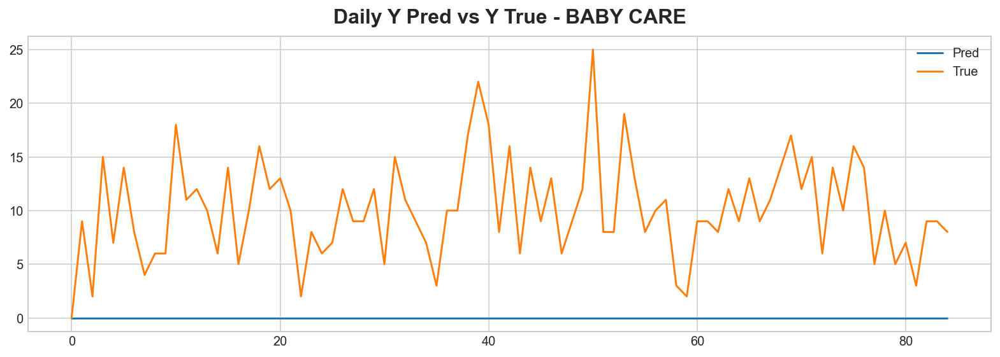

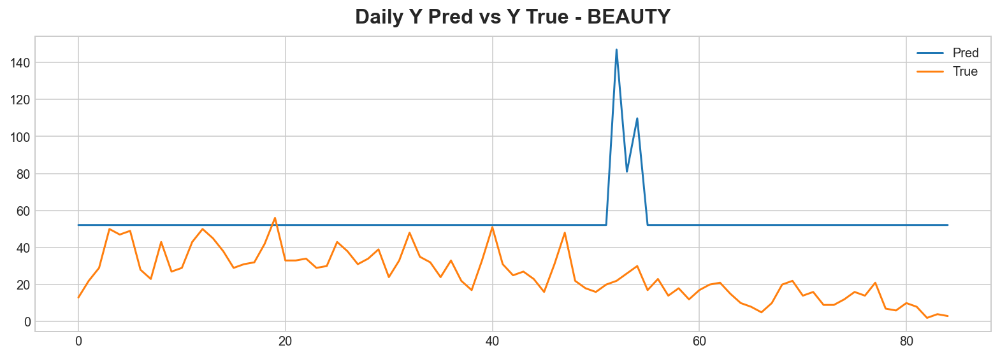

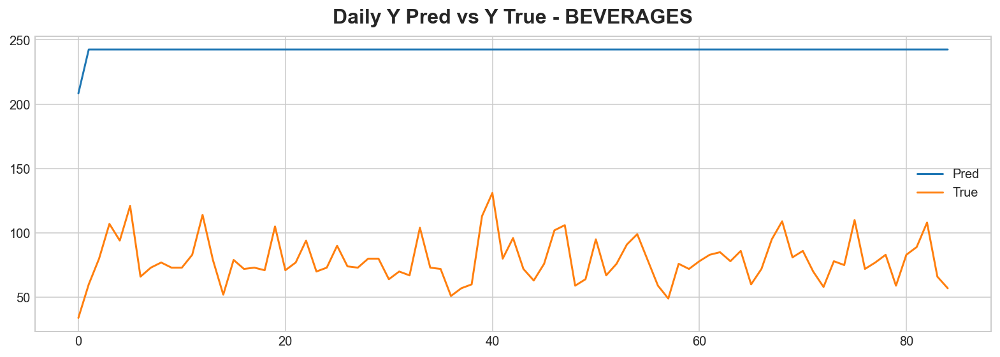

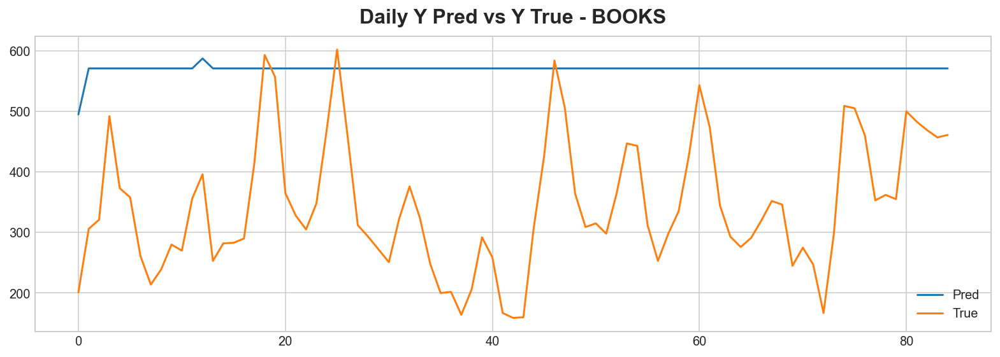

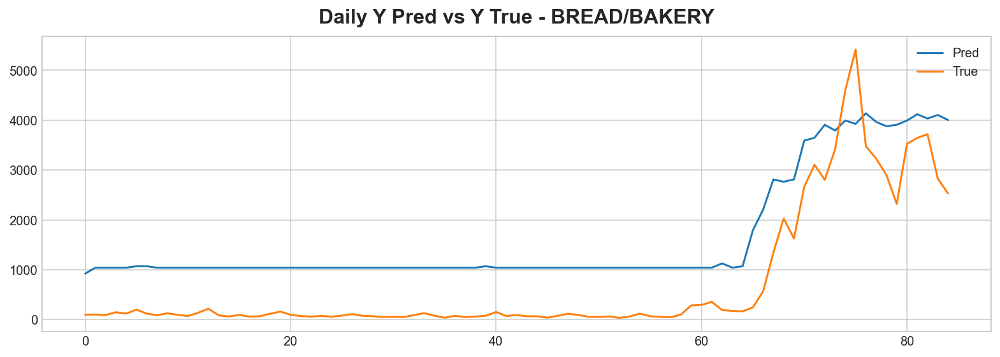

...

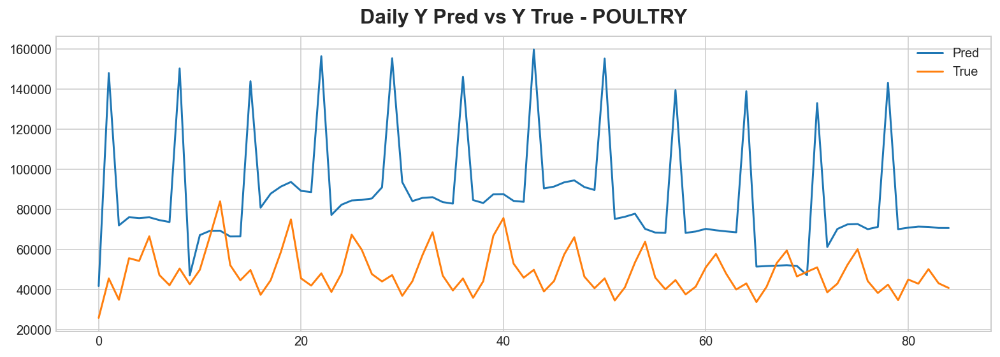

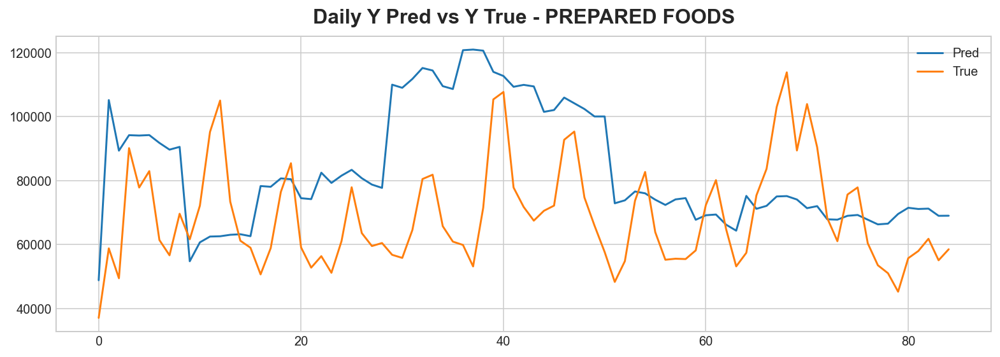

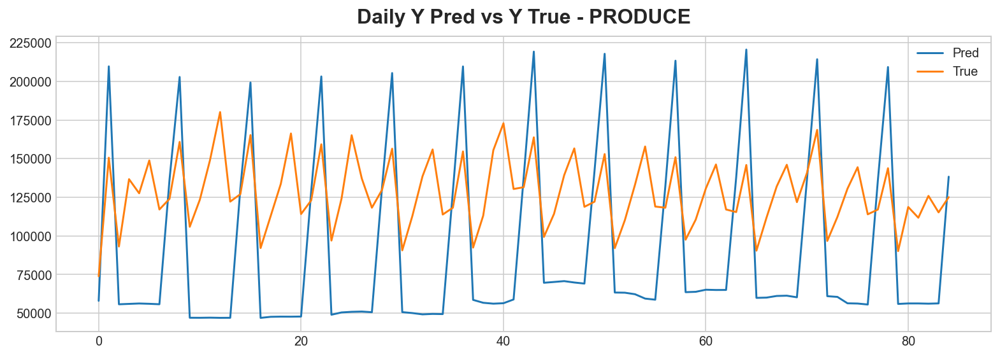

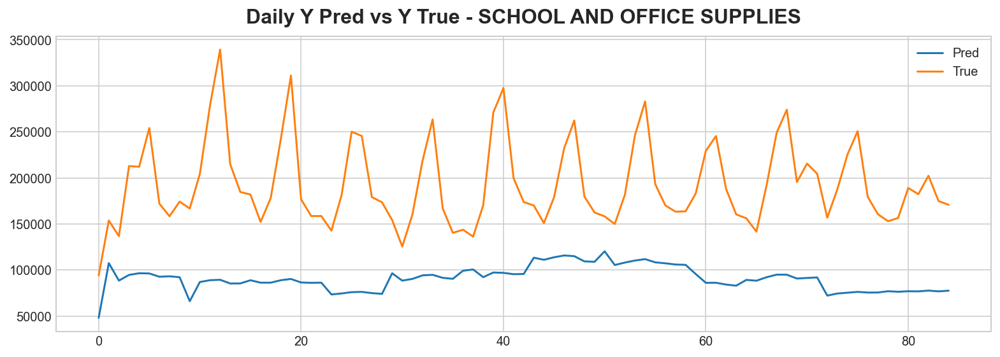

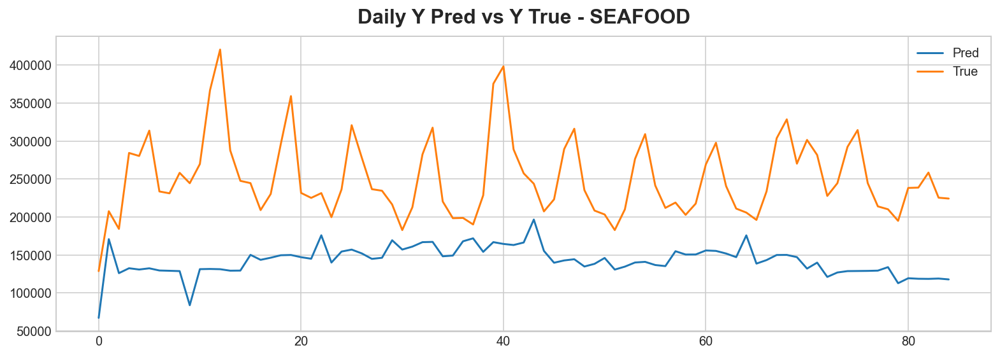

In [105]:
import statsmodels.api as sm
import statsmodels.formula.api as smf


X = dataFull.loc[:, dataFull.columns.tolist()]
Xin = X.drop('sales', axis=1)
Xin = Xin.drop('holiday', axis=1)# features
y = dataFull.loc[:, 'sales'] #Target

#Split Train and Test - I lowered to 5% of full set for Test because it is hard to evaluate results with so many in test
X_train, X_test, y_train, y_test = train_test_split(
Xin, y, test_size=.05 ,shuffle=False)

fullTrain = X_train
#X_train = X_train.drop('sales', axis=1)
#add constant to predictor variables
smX = sm.add_constant(X_train)

#fit linear regression model
fit = sm.OLS(y_train, X_train).fit()

#view model summary
print(fit.summary())

y_predSM1 = fit.predict(X_test)

mse = mean_squared_error(y_test, y_predSM1)
print('MSE: ', mse)
print('RMSE: ',mse**.5)
print('R2: ', r2_score(y_test, y_predSM1))
print('RMSLE: ', np.sqrt(np.mean(np.square(np.log1p(y_predSM1) - np.log1p(y_test)))))
y_diff = [a_i - b_i for a_i, b_i in zip(y_test, y_predSM1)]
y_diff = [abs(x) for x in y_diff]
print( 'Mean Difference between True Sales & Prediction', np.mean(y_diff))

labelNames = dict(enumerate(c.cat.categories))
y_predSM1 = pd.DataFrame(y_pred)
y_predSM1.index = y_test.index
for family in range(1,33):
    #fname = 
    ptest = y_test[X_test['family']==family].groupby(by='date').sum()
    ppred = y_predSM1[X_test['family']==family].groupby(by='date').sum()
    plt.plot(range(len(ppred)), ppred, label = 'Pred')
    plt.plot(range(len(ppred)), ptest, label = 'True')
    plt.legend()
    plt.title(rf'Daily Y Pred vs Y True - {labelNames[family]}')
    plt.show()

                                 WLS Regression Results                                
Dep. Variable:                  sales   R-squared (uncentered):                   0.871
Model:                            WLS   Adj. R-squared (uncentered):              0.871
Method:                 Least Squares   F-statistic:                          2.404e+06
Date:                Mon, 06 Mar 2023   Prob (F-statistic):                        0.00
Time:                        14:19:19   Log-Likelihood:                     -2.1382e+07
No. Observations:             2861001   AIC:                                  4.276e+07
Df Residuals:                 2860993   BIC:                                  4.276e+07
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

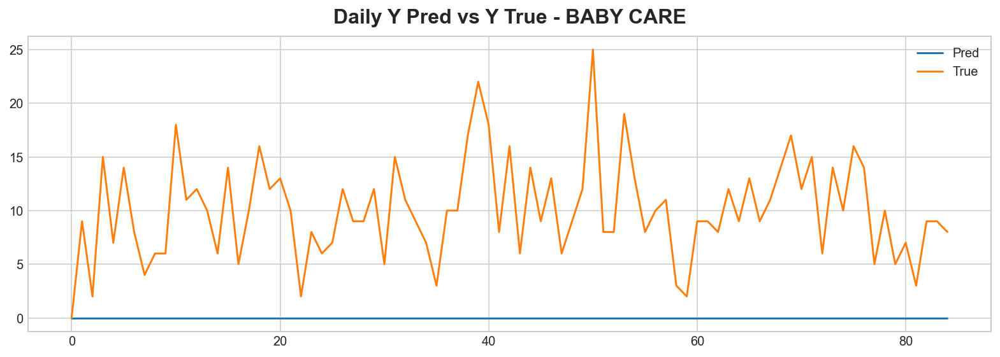

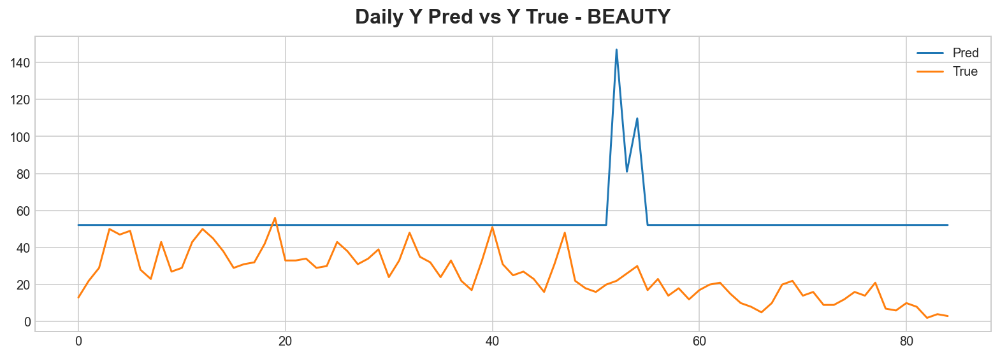

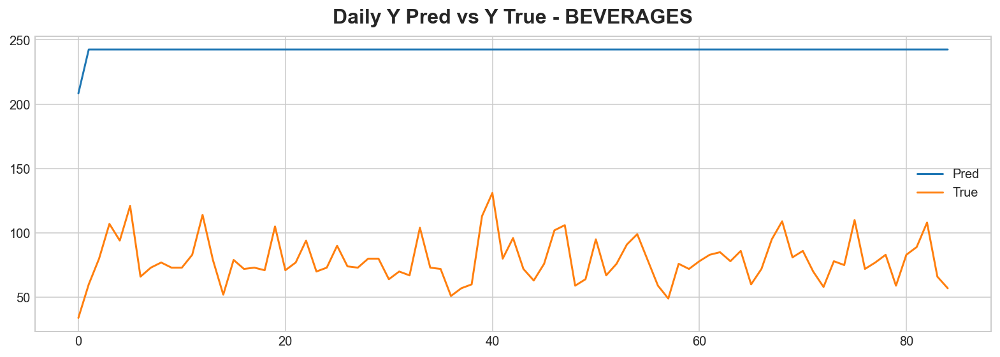

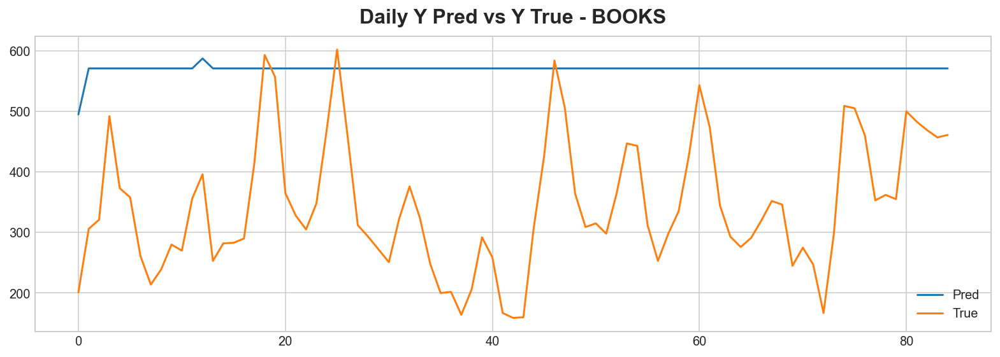

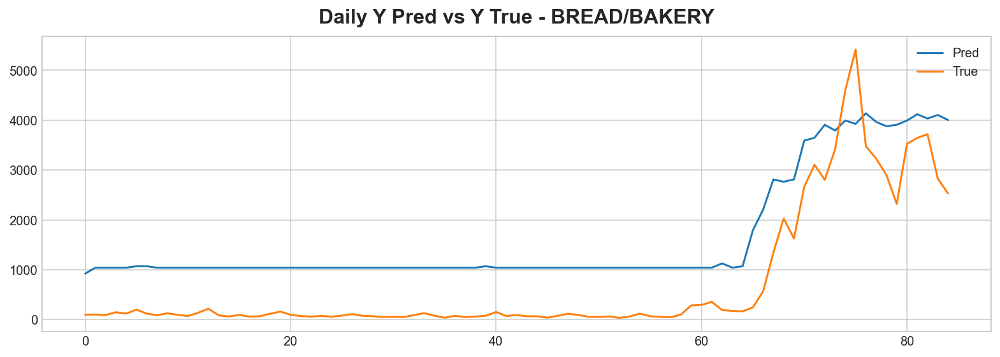

...

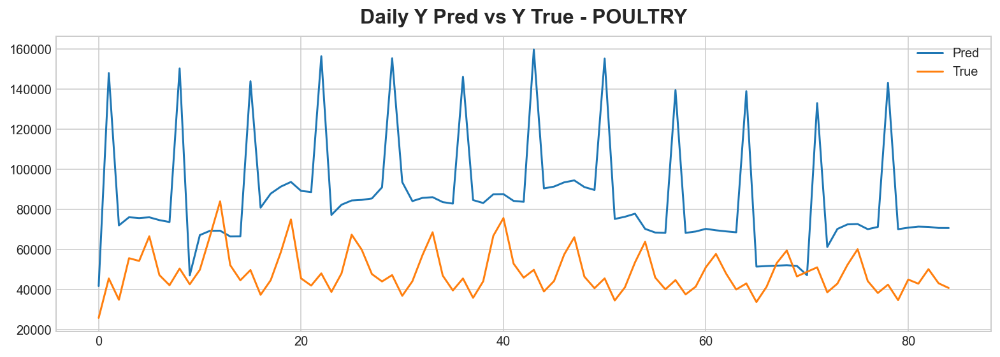

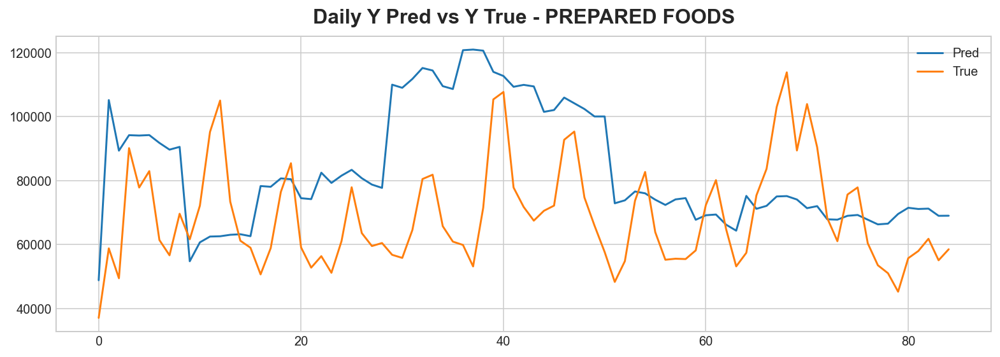

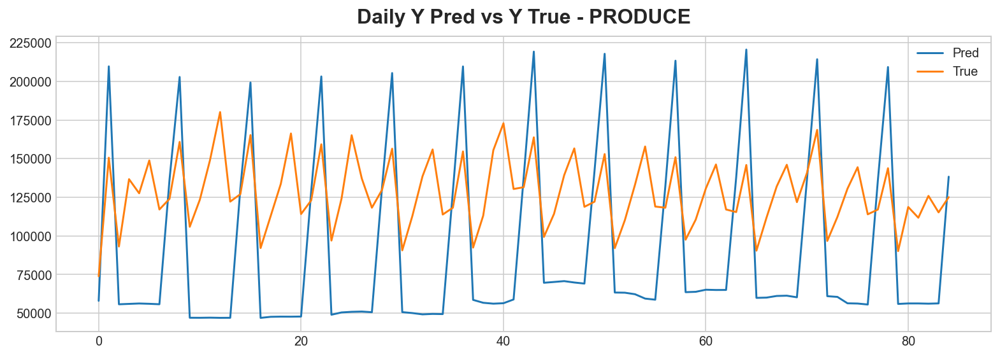

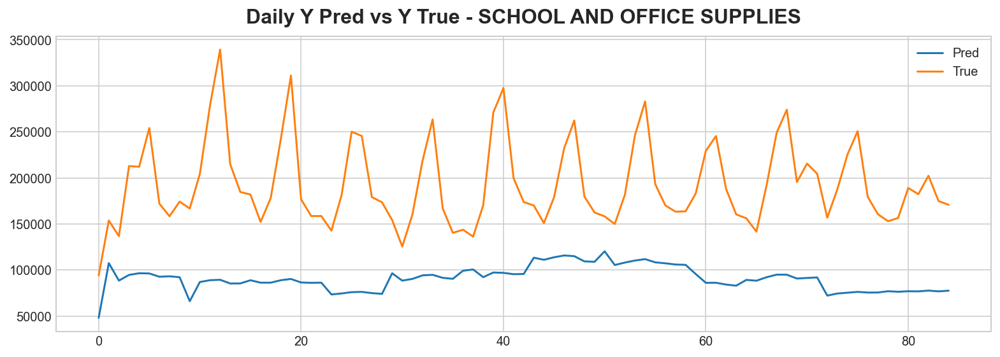

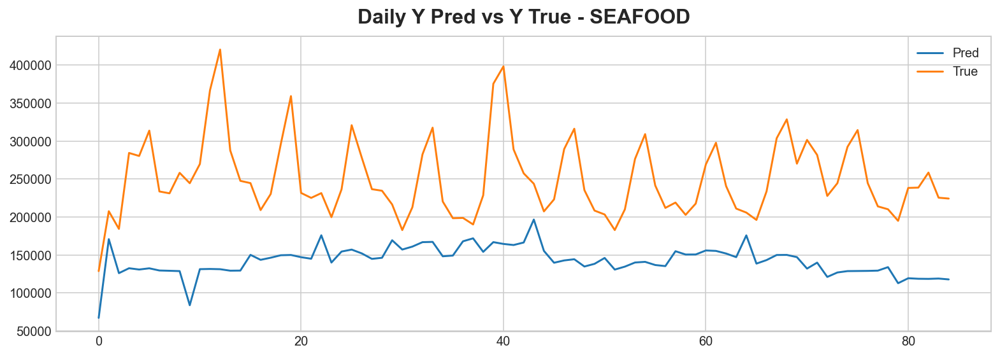

In [106]:
df = X_train
df['sales'] = y_train
df2 = df.drop(['year','store_nbr','oil'], axis = 1)

wt = 1 / smf.ols('fit.resid.abs() ~ fit.fittedvalues', data=df).fit().fittedvalues**2

X_train = X_train.drop(['sales','year','store_nbr','oil'], axis = 1)
#fit weighted least squares regression model
fit_wls = sm.WLS(y_train, X_train, weights=wt).fit()

#view summary of weighted least squares regression model
print(fit_wls.summary())

y_predSM2 = fit.predict(X_test)

mse = mean_squared_error(y_test, y_predSM2)
print('MSE: ', mse)
print('RMSE: ',mse**.5)
print('R2: ', r2_score(y_test, y_predSM2))
print('RMSLE: ', np.sqrt(np.mean(np.square(np.log1p(y_predSM2) - np.log1p(y_test)))))
y_diff = [a_i - b_i for a_i, b_i in zip(y_test, y_predSM2)]
y_diff = [abs(x) for x in y_diff]
print( 'Mean Difference between True Sales & Prediction', np.mean(y_diff))

labelNames = dict(enumerate(c.cat.categories))
y_predSM2 = pd.DataFrame(y_pred)
y_predSM2.index = y_test.index
for family in range(1,33):
    #fname = 
    ptest = y_test[X_test['family']==family].groupby(by='date').sum()
    ppred = y_predSM2[X_test['family']==family].groupby(by='date').sum()
    plt.plot(range(len(ppred)), ppred, label = 'Pred')
    plt.plot(range(len(ppred)), ptest, label = 'True')
    plt.legend()
    plt.title(rf'Daily Y Pred vs Y True - {labelNames[family]}')
    plt.show()